---
title: "Modelling sediment yield in an elementary catchment: reducing the complexity to the key processes"
---

In [1]:
import os, sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import pandas as pd
import seaborn as sns
import datetime
import ipywidgets as widgets
import rasterio as rio

from IPython.display import Image
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual

This notebook is an extension of a presentation I gave at EGU. The presentation is/was a talk that lasted only 7 minutes, so covers the message but not the detail. In this notebook I will therefore try to go into some detail. I have three questions:

**What** : Can we use an *off-the-shelf* LEM to model the flux of sediment from a *simple* catchment?

**Why** : Mud-floods and soil loss are hurting our economy and agriculture in northwest Europe.

**What did we learn?** : Groundwater pathways cannot be ignored.

## Erosion and soil loss in northern France

Soil loss in northwest France is a significant problem. Changes in agricultural practices in the last few decades has seen the size of fields increase and natural barriers to erosion such as hedgerows to be removed. This can be seen by the formation of gullies within the fields. To try and limit this, fascines have been installed in recent years, but a lack of maintenance has lead these structures to disintegrate. To try and understand and monitor the erosion of this landscape a rainfall gauge and monitoring station was installed to measure the water and suspended sediment flux coming out of the small elementary catchment, the Pommeroye.

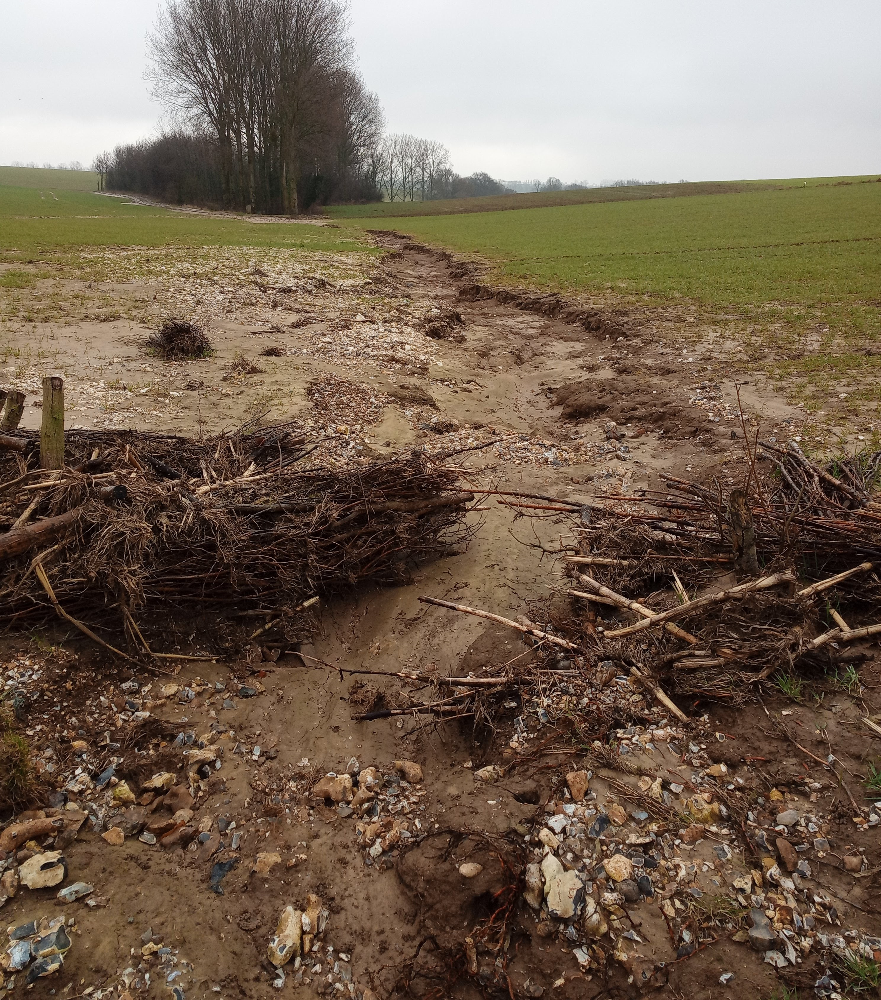

In [2]:
Image('../ravine.jpg', width=400)

## An elementary catchment

The Pommeroye is located in northwest France and consists of a few large fields. It is a ephemeral tributary to the Planquette, which is in turn a tributary to the Canche. The geology of this region is of a loess plateau, with a shallow and deeper aquifer system of chalk and flint, separated by a marl layer. The soils are poor in organic matter, which is exasperated by seasonal erosion.

The rain gauge is located at the star in the image below, and there is a Venturi canal at the circle. In the canal the water flux and turbidity is measured. From the turbidity an estimate of the quantity of material in suspension can be estimated, see [Patault et al. (2019)](https://doi.org/10.1016/j.heliyon.2019.e01407). 

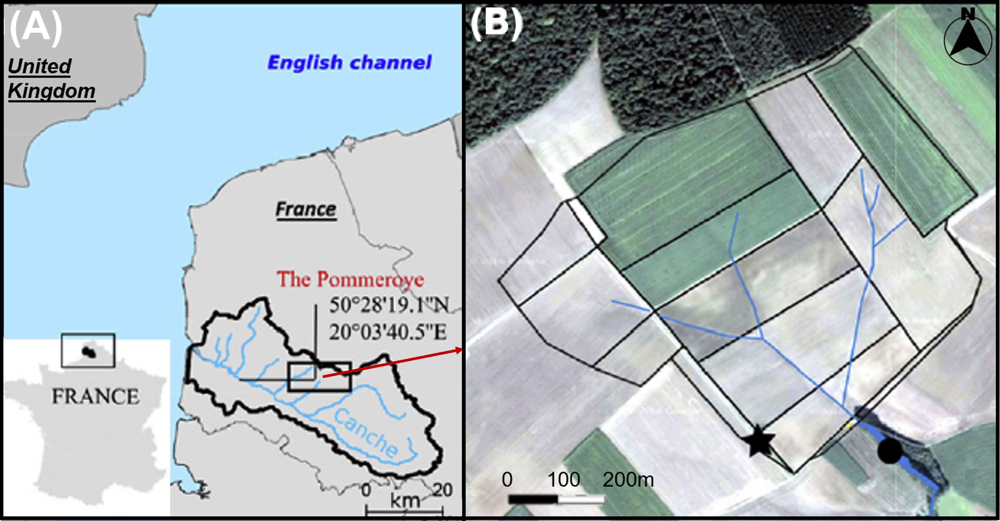

In [3]:
Image('../location-map.png', width=1000)

## Two years of suspended sediment monitoring

Two years of near continuous monitoring was carried out by Edouard Patault as part of his PhD at IMT Europe Nord [(Patault et al. 2019)](https://doi.org/10.1016/j.heliyon.2019.e01407). This information is plotted below, with two gaps of missing rainfall data filled using the nearest Méteo France weather station data from Fauquemberges, which is located at about 20 km form the catchment. There are two take home messages from this data:

* Water flux and suspended sediment flux are not linear correlated with rainfall. The largest peak in water flux is for the storm of November 2016, while highest spike in rainfall is in May 2016. However the storm in May 2016 does lead to a high sediment yield.

* Not every storm or rainfall event leads to surface runoff in the Pommeroye. For example from August to October 2016 there is very little water flux despite multiple rainfall events.

In [4]:
rainfall = pd.read_pickle('../Pommeroy-rainfall.pkl')
rainfall_fill = pd.read_pickle('../Pommeroy-rainfall-fill.pkl')
debit = pd.read_pickle('../Pommeroy-observations.pkl')

In [5]:
sns.set(rc={'figure.figsize':(20, 10)})

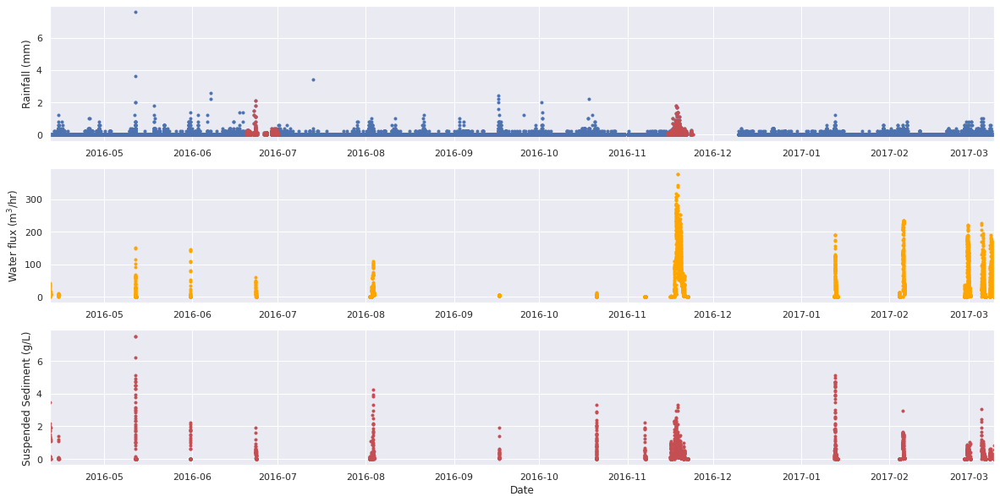

In [6]:
plt.figure(figsize=[20,10])  # this figure size has been buggy in the rendering of the notebook
plt.subplot(3,1,1)
plt.plot(rainfall['date'], rainfall['rain'], '.b')
plt.plot(rainfall_fill['date'], rainfall_fill['rain'], '.r')
plt.ylabel('Rainfall (mm)')
plt.xlim(debit['DateDebit'].min(), debit['DateDebit'].max())
plt.subplot(3,1,2)
plt.plot(debit['DateDebit'], debit['Débit m3/h'], '.', color='orange')
plt.ylabel('Water flux (m$^{3}$/hr)')
plt.xlim(debit['DateDebit'].min(), debit['DateDebit'].max())
plt.subplot(3,1,3)
plt.plot(debit['DateDebit'], debit['MES g/L'], '.r')
plt.ylabel('Suspended Sediment (g/L)')
plt.xlabel('Date')
plt.xlim(debit['DateDebit'].min(), debit['DateDebit'].max())
plt.tight_layout
#plt.savefig('rainfall-obs.png', dpi=300)
plt.show()

## An *off-the-shelf* LEM : CAESAR-Lisflood (CL)

The aim of this project was therefore to test if [CAESAR-Lisflood](https://doi.org/10.1002/esp.3478) can approximate the signal observed between precipitation and suspended sediment flux.

* Rainfall is height in 6-minute intervals that needs to be converted to a rate:
    * Precipitation is modeled as a rate, but measured as a height per 6-minute intervals. The numerical time step choice defines how long it takes for the model to run. After testing various resolutions it was found that a time step of 1 hr was ideal in terms of the compromise between accuracy and computation time. Therefore the question what rainfall is representative for the 1 hour window. From further testing, it was found that the maximum height recorded in any 1 hour window gave the best representation in terms of water flux. This is a compromise to capture the flashy nature of rainfall, but not overestimate the total quantity.
* Rainfall converted to runoff via `TOPMODEL` - key parameter $m$ that controls the recession of the hydrograph.
    * More about that below
* Runoff routed using `Lisflood` - key parameter $n$ that is the Mannings roughness.
    * We kept $n$ fixed, but this controls the responsiveness of the system to change.
* Sediment transported using the similarity model of Wilcox & Crowe (2003).
* Detachment-limited erosion following $E=k_e\left(\tau_b-\tau_c\right)^P$ with $k_e$ the erosion coefficient, $P=1.5$
    * We want to recreate the notion of a more erodable top soil that sits above a more compacted base layer. Therefore we use the detachment-limited erosion law to approximate the need for runoff to erode the deeper soil when exposed.


**The details**

Below I will go into a bit more detail for those that are interested. CAESAR-Lisflood is a process based model where laws are applied at the level of a cell to redistribute mass down system. It was originally based on the ideas of cellular automaton models, but has since diverged from this as the law used to route water is based on a continuum equation and it is the water flux that defines the time step. CL works on a square cells. Laws operate either within the adjacent cells or with the cells around them. It merges the hydrodynamic flow model LISFLOOD-FP 2D with geomorphic model CAESAR to simulate in a catchment the erosion and deposition of sediments and water flow. It models the impact on the transported suspended and bed load of the surface run-off due to the changes in precipitation [(Coulthard et al., 2013)](https://doi.org/10.1002/esp.3478). The model is fixed in space but continuous in time.

**Water flux**

The water flux is calculated with `Lisflood-FP` model from shallow water equations:
$$
\underbrace{{\frac{\partial Q}{\partial t}}}_{\text{acceleration}} +\underbrace{{\frac{\partial}{\partial x}\left[\frac{Q^2}{A}\right]}}_{\text{advection}} +\underbrace{{\frac{gA\partial\left(h+z\right)}{\partial x}}}_{\text{water~slope}}
+\underbrace{{\frac{gn^2Q^2}{R^{4/3}A}}}_{\text{friction~slope}}=0
$$
With $z$ the bed elevation, $A$ the flow cross section area, $R$ the hydraulic radius and $g$ the acceleration due to gravity. From the shallow water equations the advection term can be neglected as it is not important for the flows. The cross-sectional area in a rectangular channel is divided by a constant flow width. This gives a flow rate per unit width. With the depth of the flow the hydraulic radius is approximated and can be discretised [(Bates et al., 2010)](https://doi.org/10.1016/S0022-1694(00)00278-X). The calculation of water flux across the cells at the new time step in the model $t+ \Delta t$ is then, 
$$
q_{t+\Delta t}=\frac{q_t-gh_t \Delta t (\Delta (h_t+z_t ) / \Delta x))}{1+gh_t \Delta tn^2  q_t / h_t^{10/3}}
$$
The time step is then limited by the shallow water CFL condition to maintain stability. The maximum time step is a function of the spatial discretization and the flow depth,
$$
\Delta t_{max}= \alpha \frac{\Delta x}{(gh)^{1/2}},
$$
where $\alpha$ is a coefficient between 0.3 and 0.7, which is introduced to reduce the time step [(Coulthard et al., 2013)](https://doi.org/10.1002/esp.3478). This puts a limit on the time-scale over which this water flux can be solved as the maximum time step is a function of the flow height and the spatial discretization. The flow of water in and out of each cell is then used to drive erosion and deposition of sediments by both bed load and suspended load transport.

**Rainfall**

Rainfall will infiltrate the soil until it is saturated, and the excess of water will run-off onto the subsurface. The run-off is calculated from an adaptation of the hydrological model `TOPMODEL` that approximates the loss of water due to infiltration [(Beven & Kirkby, 1979)](https://doi.org/10.1080/02626667909491834). Run-off is given by,
$$
r=\frac{m}{\Delta t} \log \left( \frac{(p-jt+\Delta t) + \exp  \left(p \Delta t / m\right)}{p}  \right)
$$
With $m$ a parameter that describes the reduction of water saturation with depth, $p$ the precipitation and $j$ the soil moisture content ($t+\Delta t$ per unit time). When there is precipitation the soil moisture content is replenished, hence at the next time step it is given by,
$$
j_{t+\Delta t}=\frac{p}{((p-j_t) / j_t) \exp \left(1-(p\Delta t / m \right)} 
$$
In the absence of precipitation runoff is given by,
$$
r=\frac{m}{\Delta t}\log \left(1+\frac{j_{t+\Delta t} \Delta t}{m} \right)
$$
And the soil moisture content is,
$$
j_{t+\Delta t}=\frac{j_t}{1-(j_t \Delta t / m)}	
$$

Precipitation is therefore converted into run-off at each cell, and the run-off is then routed through the catchment using equation the above equations.

**Sediment transport**

There are two sediment transport options in the CL model. The Einstein Brown formulation and the Wilcock and Crowe formulation. The Einstein-Brown method is based predominately on sand-based laboratory channels. We will focus on the Wilcock and Crowe formulation because the Einstein formula has larger associated uncertainties and tends to underestimate the data [(Walsh et al., 2020)](https://doi.org/10.1016/j.geomorph.2020.107209). [Wilcox & Crowe (2003)](https://doi.org/10.1061/(ASCE)0733-9429(2003)129:2(120)) developed a sediment transport model for a combination of variable grain size. Within this model sediment can be transported as bed load or suspended load with maximum nine grain size. The water flux is first transformed into a shear velocity. The flow velocity of water across the cell boundary, $u$, is given by,
$$
u=\frac{q}{h \Delta x}
$$
This velocity is then used to calculate the basal shear stress across the cell boundary, $\tau_{b}$,
$$
\tau_b=\rho C_f\left|u\right|^2
$$
With $\rho$ the water density and $C_f$ the Darcy-Weishbach friction factor. Therefore, we have the shear velocity:
$$
u_\ast=\sqrt{\frac{\tau_b}{\rho}}
$$

The sediment flux is then given by,
$$
q_i=\frac{F_iu_\ast^3W_i^\ast}{\left(s-1\right)g} 
$$
With $i$ the grain size fraction, $s$ the ratio of sediment to water density, $F_i$ the proportion of the grain size within the bed and $W_i^\ast$ the empirical transport function [(Wilcox & Crowe, 2003)](https://doi.org/10.1061/(ASCE)0733-9429(2003)129:2(120)). 

The transport function $W_i^\ast$ is derived from a series of flume experiments on mixed grain sizes and is given by,
$$
W_i^\ast=f\left(\tau_b / \tau_{ri}\right)
$$
Where $\tau_{ri}$ is the reference shear stress for each grain size fraction. [Wilcox & Crowe (2003)](https://doi.org/10.1061/(ASCE)0733-9429(2003)129:2(120)) adjust the curves by eye (!!) for the parametrization. The transport function can be adjusted with the measurements of particle size fraction $F_i$, the water flux $q_i$ and the shear stress $\tau_b$. 
$$
W_i^\ast=\frac{\left(s-1\right)gq_{bi}}{F_iu_i^3}
$$
With $q_{bi}$ the volumetric transport rate per unit weight of size $i$. We can then estimate the transport function with an assumed grains density from, 
$$
\tau_{ri}=\tau_{rm}\left(\frac{D_i}{D_{sm}}\right)^b
$$
and,
$$
b=\frac{0.67}{1+exp\left(1.5-D_i / D_{sm}\right)}
$$
The two equations above represent a hiding function, with $D_i$ the median grain size fraction in transport, $D_sm$ the median grain size of the active surface layer, and $F_s$ the fraction of sand in the active surface layer. $\tau_{rm}$ is the value of of $\tau_{ri}$ corresponding to the mean size of $D_{sm}$, and is is calculated empirically as $\rho gD_{sm}\left(s-1\right)$ where $\tau_{rm}^\ast$ is calculated by fitting an exponential curve to flume data as,
$$
\tau_{rm}^\ast=0.021 + 0.015 exp\left(-20F_s\right)
$$

Finally, from the shear stress, $\tau_{b}$, the transport function can be calculated: 
$$
W_i^\ast=0.002\left(\frac{\tau_b}{\tau_{ri}}\right)^{7.5},\left(\frac{\tau_b}{\tau_{ri}}\right)<1.35
$$
or,
$$
W_i^\ast=14\left(1-\frac{0.894}{\left(\frac{\tau_b}{\tau_{ri}}\right)^{0.5}}\right)^{4.5},\left(\frac{\tau_b}{\tau_{ri}}\right)\geq1.35
$$

Subsequently the sediment volume per cell per grain size fraction is calculated from the flux,
$$
V_i=q_i\Delta t
$$
The sediment fractions are then routed down slope. The finest grain size fraction is transported as suspended load and the rest as bed load. Bed load is distributed proportional to the local slope and all the sediment is deposited within the time step,
$$
V_{i,bed}^k=\frac{S^{j\rightarrow k}}{\sum\ S}V_{i,bed}^j
$$
With $k$ the index of the receiver cell and $j$ the index of the donor cell.
 
The sediment from the suspended load is distributed proportionally to the water flow: 
$$
V_{i,susp}^k=\frac{u^{j\rightarrow k}}{\sum\ u}V_{i,susp}^j
$$
The suspended sediment falls to the ground depending on the settling velocity: 
$$
V_{i,dep}=\kappa v_i\left(\mathrm{\Delta x}\right)^2 \Delta t
$$
With $v_i$ the settling velocity and $k$ the sediment concentration in suspension.

To summarize the bed load is moving from one cell to its neighbouring cell while the suspended load depends on the concentration of sediment in suspension in a cell. Thus, between bed and suspended load the sediment deposition will not be the same [(Coulthard et al., 2013)](https://doi.org/10.1002/esp.3478). The sediment mass is fully conserved and as per the flow model bedload transport is calculated for the D4 directions. Several grain sizes that are transported and deposited this makes it possible to model a variation of the particle size distribution in space. 

**Falling velocity**

Suspended sediment is deposited per time step. The user can choose the value of falling velocity of the suspended grain size. The fall velocity can be estimated from Stokes Law assuming laminar flow,
$$
v_i=\frac{sgD_i^2}{18\mu}
$$
With $\mu$ the kinematic viscosity of water. [Ferguson & Church (2004)](http://dx.doi.org/10.1306/051204740933) developed a model settling in turbulent flow,
$$
v_i=\frac{sgD_i^2}{18\mu+\sqrt{0.75sgD_i^3}}
$$
With a mean grain size of $D_{i} = 30\,\mu\rm m$ and sediment density of $1390\rm\,kg\,m^{-3}$ we obtain a fall velocity of $1.04 \times 10^{-4}\rm\,m\,s^{-1}$. 

**Sediment layer**

For each model cell, the top layer is the active layer that varies with erosion and deposition of sediment from 5 to 30\,cm. If the erosion is higher than the deposition and the limit of the active layer is exceeded, the top layer is consumed and it is the layer below that becomes the new active top layer. The sediments in this layer are movable and ready to be transported if a water flow passes above them. The grain size distribution and the active layer vary with the model evolution. There are nine layers of sediment below the active layer, each with a thickness of 20 cm. The bottom layer has a thickness that extends to the bedrock. The grain size distribution is homogeneously distributed in all layers as defined in the input parameters [(van de Weil et al., 2007)](https://doi.org/10.1016/j.geomorph.2006.10.024). The bedrock below the last sediment layer can be modelled as well and the water flow may also erode it. The first layer is therefore transport limited, i.e. a layer of sediment ready to be transported and the layers below are detachment limited, which means that the movement of the sediment is limited by the flow of water. Water is needed to release the sediment, so the layer has erodibility. Erosion will occur if the shear stress $\tau_b$ higher than the critical shear stress $\tau_c$:
$$
E=k_e\left(\tau_b-\tau_c\right)^P
$$
With $k_e$ the erosion coefficient, $P$ a power greater than 1.

## Sampling of rainfall data to model input

As mentioned above, the rainfall observations need to be resampled for the model from a measurement per 6-minute window to a rate in mm/hr. The mean rain water height, the total rain water height, and the maximum rain water height were tested. It was found that the maximum height measured in a one hour period gave the most representative model output in terms of water flux. If the total rainfall was used, then the water flux was overestimated, while if the mean rainfall was used, the water flux was underestimated. This is likely due to the fact that evapotranspiration is not included in the version of CAESAR-Lisflood used her, so the effect of the uptake of water by plants is not accounted for, along with evaporation from the surface of the soil or plant leaves. A second effect that is not included is the loss of water to infiltration and the shallow aquifer system. The simplification of `TOPMODEL` used does not allow for lateral transport of groundwater, rather only the temporary storage of water within each cell for the subsequent release.

Below is a comparison of the observation and the model input of the maximum rainfall in each 1 hour window. It can be seen that this represents the observation well, and captures the flashy nature of the rainfall, where significant events are captured in each hour-long time step.

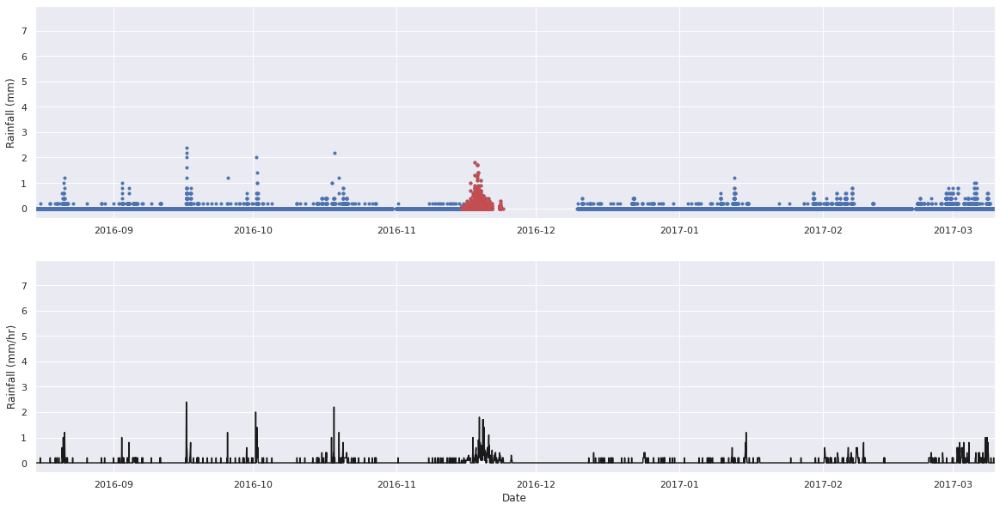

In [7]:
rain = pd.read_csv('../rainfall_max1hr_365days.txt', sep=' ', index_col=False, names=['Rainfall'])

file = '../results_NoTopSoil/sedoutput.dat'
seds_ = pd.read_csv(file, sep=' ', index_col=False,
                    names=['Time Step', 'Qw(actual)', 'Qw(expected)', 'Blank', 'Qs', 'Suspended', 'Sand', 'Gravel'])
seds_['Qw(actual)'] = seds_['Qw(actual)'] * 60 * 60
density = 1330
rock = 2660
seds_['SSC'] = seds_['Suspended'] * density / seds_['Qw(actual)']
seds_all = pd.concat([seds_, rain], axis=1, sort=False).dropna()
date_rng = pd.date_range(start='4/12/2016 02:00:00', periods=len(seds_all), freq='1H')
seds_all['date'] = date_rng[:len(seds_all)]
seds_all = seds_all.set_index('date', drop=False)

datemin = '2016-08-15 02:00:00'
datemin = datetime.datetime.strptime(datemin, '%Y-%m-%d %H:%M:%S')
datemax = debit['DateDebit'].max()

sns.set(rc={'figure.figsize':(20, 10)})
plt.figure()
plt.subplot(2, 1, 1)
plt.plot(rainfall['date'], rainfall['rain'], '.b')
plt.plot(rainfall_fill['date'], rainfall_fill['rain'], '.r')
plt.ylabel('Rainfall (mm)')
plt.xlim(datemin, datemax)

plt.subplot(2, 1, 2)
plt.plot(seds_all['date'], seds_all['Rainfall'], 'k')
plt.ylabel('Rainfall (mm/hr)')
plt.xlabel('Date')
plt.xlim(datemin, datemax)
plt.tight_layout
#plt.savefig('rainfall-input.png', dpi=300)
plt.show()

## TOPMODEL

The value $m$ controls the recession curve on the hydrograph to approximate the storage of water within the subsurface and convert precipitation to runoff. It is assumed that for each cell water is stored and released using a modified `TOPMODEL`. The model is as coded below, and it was found that $m=0.002$ gave the best fit to the observations.

In [8]:
def topmodel(m):
    dt = 3600
    r = np.empty(len(rain.Rainfall))
    j = np.empty(len(rain.Rainfall))
    rainfall = rain.Rainfall.values / 1000 / 3600
    j0 = 0.000000001
    plt.figure(figsize=[15,8])
    plt.subplot(211)
    plt.plot(rain['Rainfall'], 'k')
    plt.ylabel('Rainfall (mm/hr)')
    plt.xlim(5200, 5600)
    plt.ylim(0, 2)

    plt.subplot(212)
    for i, p in enumerate(rainfall):
        if i == 0:
            j[i] = j0
            r[i] = m / dt * np.log(1 + (j[i] * dt) / m)
        elif p == 0:
            j[i] = j[i-1]/(1 + j[i-1] * dt / m)
            r[i] = m / dt * np.log(1 + j[i] * dt / m)
        else:
            if (((p - j[i-1]) / j[i-1]) * np.exp((0. - p) * dt / m) + 1) > 0:
                j[i] = p / (((p - j[i-1]) / j[i-1]) * np.exp((0. - p) * dt / m) + 1)
            else:
                j[i] = 0
            r[i] = m / dt * np.log(((p - j[i]) + j[i] * np.exp(p * dt / m)) / p)
    plt.plot(r * 3600 * 1000)
    plt.xlabel('Time (hrs)')
    plt.ylabel('Run-off (mm/hr)')
    plt.xlim(5200, 5600)
    plt.ylim(0, 2)
    plt.tight_layout()
    #plt.savefig('topmodel.png', dpi=300)
    plt.show()
    return 

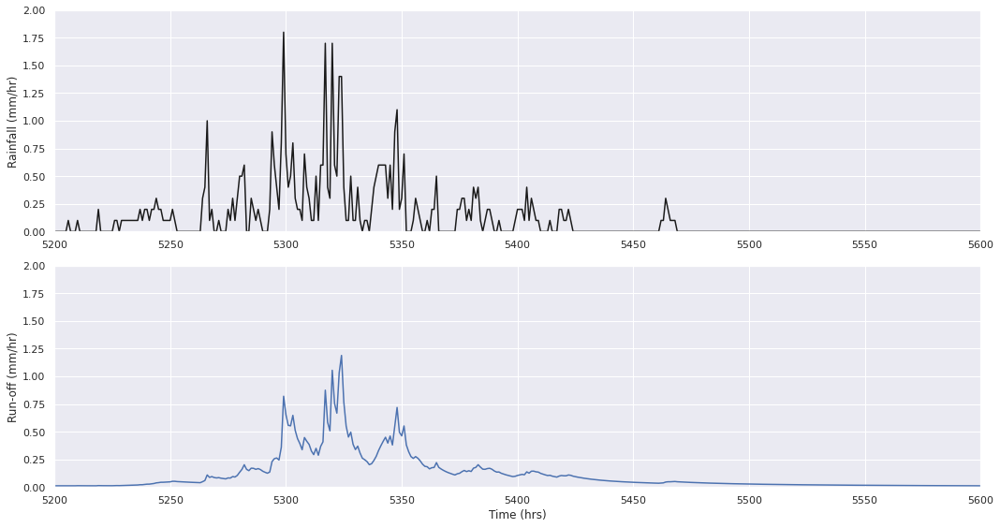

In [9]:
topmodel(0.002)

# Model with no top soil

We will explore two different model assumptions. The first is a model without layering. This is a model where it is assumed there is always sediment available for transport. The second set of models assume that there is a top layer of sediment that can be transported. Below this layer there is a layer of material that first has to be eroded by the detachment of particles of rock.

For the scenario where there is no layering, *no top soil* it can be seen that the model predicts significant erosion of the gullies within the small catchment. Significant erosion of more than 2 meters is predicted along the two gullies that form. The material is then deposited towards the outlet, with a thickness of more than 2 meters. The erosion is significant because of the assumption that the catchment consists of only sediment that is free to be transported. In reality this assumption might only be valid for the upper layer of soil.

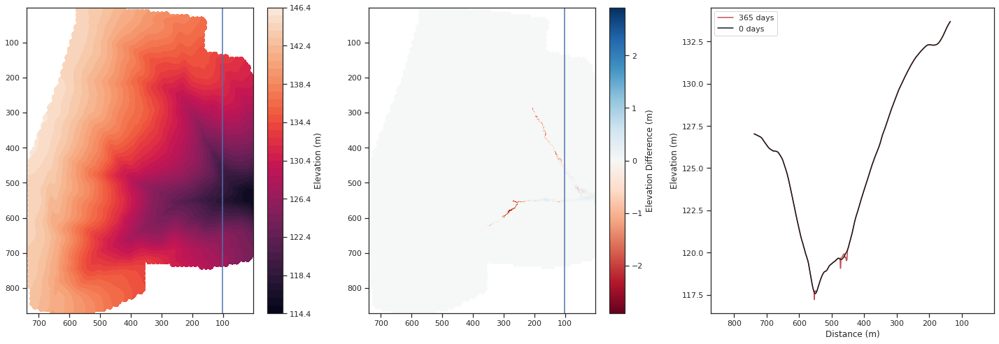

In [10]:
ascfile = '../results_NoTopSoil/Elevations518400.asc'
src = rio.open(ascfile)
data_array = src.read(1)
nrows, ncols = np.shape(data_array)
data_array[data_array <= -9999] = np.nan

dXY = 1  # 1 m resolution
xcorner = np.linspace(0.5*dXY, (ncols-0.5)*dXY, ncols)
ycorner = np.linspace(0.5*dXY, (nrows-0.5)*dXY, nrows)

x,y = np.meshgrid(xcorner, ycorner)
z = np.flip(np.flip(data_array, 1), 0)

ascfile = '../results_NoTopSoil/Elevations0.asc'
src = rio.open(ascfile)
data_array = src.read(1)
data_array[data_array <= -9999] = np.nan

x,y = np.meshgrid(xcorner, ycorner)

zstart = np.flip(np.flip(data_array, 1), 0)

cut = 100

sns.set(rc={'figure.figsize':(20, 7)})
sns.set_style("ticks")
plt.figure(figsize=[20,7])
plt.subplot(1,3,1)
plt.contourf(x, y, z, 50)
cbar = plt.colorbar()
cbar.ax.set_ylabel('Elevation (m)')
plt.xlim(x.max(), x.min())
plt.ylim(y.max(), y.min())
plt.plot(x[:,cut], y[:,cut])

plt.subplot(1,3,2)
clim = np.nanmax(np.abs(z-zstart))
plt.pcolormesh(x, y, z-zstart, cmap='RdBu', vmin=-clim, vmax=clim)
cbar = plt.colorbar()
cbar.ax.set_ylabel('Elevation Difference (m)')
plt.xlim(x.max(), x.min())
plt.ylim(y.max(), y.min())
plt.plot(x[:,cut], y[:,cut])

plt.subplot(1,3,3)
plt.plot(y[:,cut], z[:,cut], 'r')
plt.plot(y[:,cut], zstart[:,cut], 'k')
plt.xlim(y.max(), y.min())
plt.xlabel('Distance (m)')
plt.ylabel('Elevation (m)')
plt.legend(['365 days','0 days'])
plt.tight_layout()
plt.savefig('no-top-soil-1.png', dpi=300)
plt.show()

In the case of no layering, *no top soil*, the result is a hydropraph that has a maximum of just over 500 m³hr⁻¹. This is higher than that observed, but within the right
order of magnitude. Furthermore, both high magnitude and long duration rainfall events lead to increased water flux, as seen in the observations. For the increased water flux, there is subsequently multiple rainfall events that lead to significant sediment transport, of which on average a peak of no more than 20 g/L are suspended sediment. The exception is the first and largest sediment transport event of more than 50 g/L. This occurs for the peak rainfall event in May 2016. The high quantity of sediment transported here is due to the high water flux and the availability of sediment to be transport. The second highest water flux event in November 2016 conversely transports a similar quantity of sediment as the preceding rainfall events in the autumn of 2016.

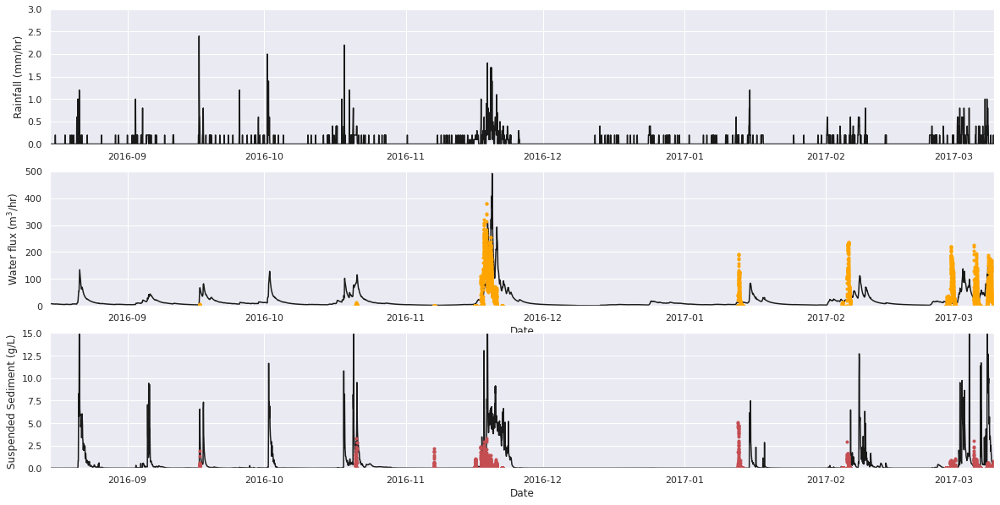

In [11]:
file = '../results_NoTopSoil/sedoutput.dat'
seds_ = pd.read_csv(file, sep=' ', index_col=False,
                    names=['Time Step', 'Qw(actual)', 'Qw(expected)', 'Blank', 'Qs', 'Suspended', 'Sand', 'Gravel'])
seds_['Qw(actual)'] = seds_['Qw(actual)'] * 60 * 60
density = 1330
rock = 2660
seds_['SSC'] = seds_['Suspended'] * density / seds_['Qw(actual)']
seds_all = pd.concat([seds_, rain], axis=1, sort=False).dropna()
date_rng = pd.date_range(start='4/12/2016 02:00:00', periods=len(seds_all), freq='1H')
seds_all['date'] = date_rng[:len(seds_all)]
seds_all = seds_all.set_index('date', drop=False)

datemin = '2016-08-15 02:00:00'
datemin = datetime.datetime.strptime(datemin, '%Y-%m-%d %H:%M:%S')
datemax = debit['DateDebit'].max()

sns.set(rc={'figure.figsize':(20, 10)})
plt.figure()
plt.subplot(3, 1, 1)
plt.plot(seds_all['date'], seds_all['Rainfall'], 'k')
plt.ylabel('Rainfall (mm/hr)')
plt.xlim(datemin, datemax)
plt.ylim(0, 3)

plt.subplot(3, 1, 2)
plt.plot(seds_all['date'], seds_all['Qw(actual)'], 'k')
plt.plot(debit['DateDebit'], debit['Débit m3/h'], '.', color='orange')
plt.ylabel('Water flux (m$^{3}$/hr)')
plt.xlabel('Date')
plt.xlim(datemin, datemax)
plt.ylim(0, 500)

plt.subplot(3, 1, 3)
plt.plot(seds_all['date'], seds_all['SSC'], 'k')
plt.plot(debit['DateDebit'], debit['MES g/L'], '.r')
plt.ylabel('Suspended Sediment (g/L)')
plt.xlabel('Date')
plt.xlim(datemin, datemax)
plt.ylim(0, 15)
plt.tight_layout
#plt.savefig('no-top-soil-3.png', dpi=300)
plt.show()
plt.show()

# Model with 30 cm of top soil

The model with two soil layers, a 30 cm thick surface layer of mobile sediment and a base layer that is detachment-limited, generates patterns of erosion that are significantly reduced. For the model with an erodability of $k_e = 10^{-5}$ the gullies have a maximum depth of 40 cm after one year of run time. When the erodability is $k_e = 10^{-2}$  the gullies are up to 80 cm deep. This second case is shown below. Within the Pommeroye catchment we observe gullies with up to 50 cm of relief, however the gullies are not allowed to freely form over a whole year as with each new crop cycle the fields are reworked and the gullies are almost completely removed. For example in the autumn of 2021 the gullies were reduced to no more than 20 cm in depth.

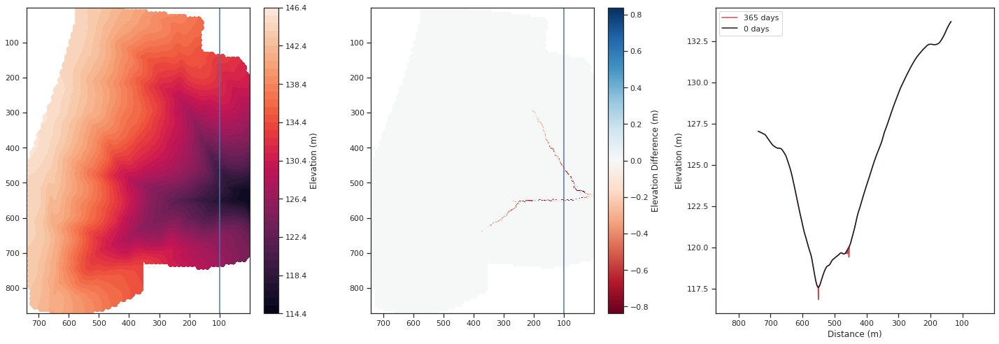

In [12]:
ascfile = '../results_30cmTopSoil/Elevations518400.asc'
src = rio.open(ascfile)
data_array = src.read(1)
data_array[data_array <= -9999] = np.nan
z = np.flip(np.flip(data_array, 1), 0)

sns.set(rc={'figure.figsize':(20, 7)})
sns.set_style("ticks")
plt.figure()
plt.subplot(1,3,1)
plt.contourf(x, y, z, 50)
cbar = plt.colorbar()
cbar.ax.set_ylabel('Elevation (m)')
plt.xlim(x.max(), x.min())
plt.ylim(y.max(), y.min())
plt.plot(x[:,cut], y[:,cut])

plt.subplot(1,3,2)
clim = np.nanmax(np.abs(z-zstart))
plt.pcolormesh(x, y, z-zstart, cmap='RdBu', vmin=-clim, vmax=clim)
cbar = plt.colorbar()
cbar.ax.set_ylabel('Elevation Difference (m)')
plt.xlim(x.max(), x.min())
plt.ylim(y.max(), y.min())
plt.plot(x[:,cut], y[:,cut])

plt.subplot(1,3,3)
plt.plot(y[:,cut], z[:,cut], 'r')
plt.plot(y[:,cut], zstart[:,cut], 'k')
plt.xlim(y.max(), y.min())
plt.xlabel('Distance (m)')
plt.ylabel('Elevation (m)')
plt.legend(['365 days','0 days'])
plt.tight_layout()
#plt.savefig('top-soil-1.png', dpi=300)
plt.show()

A high erodability, $k_e = 10^{-2}$, generates a continual response in terms of sediment flux for each large rainfall event. The first rainfall event, as before, erodes most of the top surface of sediment, but subsequently there is erosion into the base layer for all of the rainfall events. Suspended sediment concentrations are generally low once the the gullies are formed, around or below 10 g/L, which is a similar magnitude to the observed concentrations.

The model differs from the observations in terms of the response of the catchment to rainfall particularly in the summer months. The model routs all water over the surface, with a delay in the magnitude of runoff as described by `TOPMODEL`. While the `TOPMODEL` parameter $m$ can be varied to fit the response of the hydrograph, which would be typically done for a stream or river that flowed continuously, in the case of the Pommeroye certain rainfall events lead to zero runoff. This means that the model predicts a surface runoff event when none occurred.

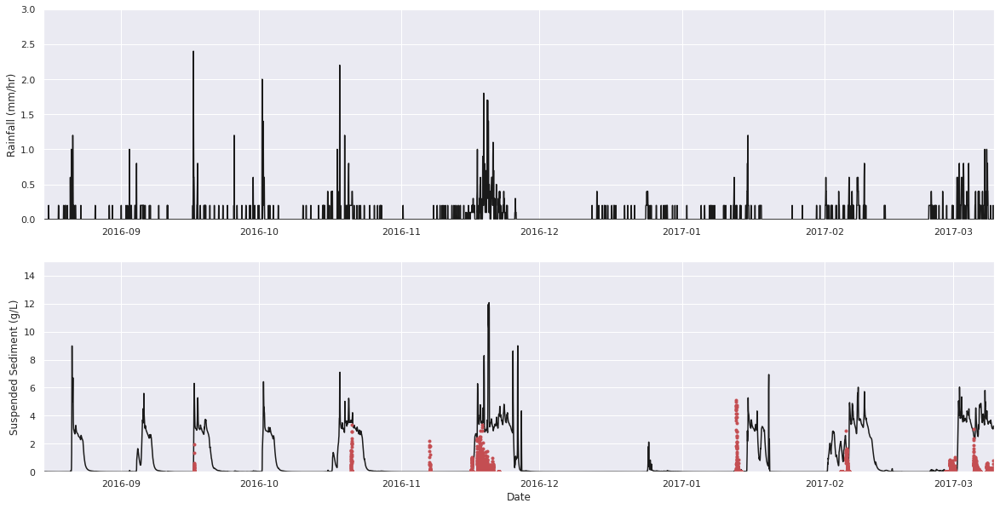

In [13]:
file = '../results_30cmTopSoil/sedoutput.dat'
seds_ = pd.read_csv(file, sep=' ', index_col=False,
                    names=['Time Step', 'Qw(actual)', 'Qw(expected)', 'Blank', 'Qs', 'Suspended', 'Sand', 'Gravel'])
seds_['Qw(actual)'] = seds_['Qw(actual)'] * 60 * 60
density = 1330
rock = 2660
seds_['SSC'] = seds_['Suspended'] * density / seds_['Qw(actual)']
seds_all = pd.concat([seds_, rain], axis=1, sort=False).dropna()
date_rng = pd.date_range(start='4/12/2016 02:00:00', periods=len(seds_all), freq='1H')
seds_all['date'] = date_rng[:len(seds_all)]
seds_all = seds_all.set_index('date', drop=False)

datemin = '2016-08-15 02:00:00'
datemin = datetime.datetime.strptime(datemin, '%Y-%m-%d %H:%M:%S')
datemax = debit['DateDebit'].max()

sns.set(rc={'figure.figsize':(20, 10)})
plt.figure()
plt.subplot(2, 1, 1)
plt.plot(seds_all['date'], seds_all['Rainfall'], 'k')
plt.ylabel('Rainfall (mm/hr)')
plt.xlim(datemin, datemax)
plt.ylim(0, 3)

plt.subplot(2, 1, 2)
plt.plot(seds_all['date'], seds_all['SSC'], 'k')
plt.plot(debit['DateDebit'], debit['MES g/L'], '.r')
plt.ylabel('Suspended Sediment (g/L)')
plt.xlabel('Date')
plt.xlim(datemin, datemax)
plt.ylim(0, 15)
plt.tight_layout
#plt.savefig('top-soil-2.png', dpi=300)
plt.show()

# Discussion

In the plot above of the predicted and observed suspended sediment flux, at first order, the model which has not been calibrated does a remarkable job of recreating the timing and magnitude of sediment transport events as a function of precipitation. The model is a gross simplification of a complex system. With calibration, the magnitude and duration of sediment flux events could be better fit. Key parameters are (1) the Manning's coefficient, which impacts the response time of the model from peak in precipitation to peak in water and sediment flux, and (2) the parameter $m$ of `TOPMODEL` which likewise impacts the response and magnitude of the water and sediment flux. Furthermore, we have made the assumption that the grain size properties of the catchment are represented by three grains, gravel, sand and silt from field observations. This distribution will have an effect on the quantity of sediment transported, and may vary with time. However, the intention of this study was not to calibrate the model, but to explore in broad terms how it performs in approximating an elementary catchment.

In terms of model comparison there is one key miss-fit: in August, September, October, and December 2016 the model predicts runoff events where none were observed. The August and September events could be dismissed as being during the model wind-up where significant miss-fit could be expected. In October and December however the model has already recreated observed events, yet predicts runoff where there is none. This model result is because of the strong assumption that all water leaves the catchment as runoff. There is temporary storage in the subsurface, as modelled by `TOPMODEL`, but there is no subsurface loss of water to the shallow and deeper aquifers. A further omission from the model is that there is no evapotranspiration. This is not implemented in the C++ version of CAESAR-Lisflood used. This would lead to water being used before it can exit the catchment. While the October event could be miss-represented due to the lack of evapotranspiration, in December the uptake of water by plants is unlikely. This suggests that groundwater pathways can likewise not be overlooked.

In the Canche the aquifers provide a stable baseflow to the river [(Belles et al., 2021)](https://doi.org/10.3390/w11071428). This coupled with the ephemeral nature of the Pommeroye as a head water catchment might suggest that the loss of water to groundwater pathways cannot be ignored, even in the modelling of a relatively simple elementary catchment. This will hopefully be a focus of future work.

# Summary

**What** : Can we use an *off-the-shelf* LEM to model the flux of sediment from a *simple* catchment?

*Yes* but the simple catchment is horribly complex. The ephemeral nature of surface runoff is not captured without consideration of evapotranspiration or groundwater pathways. The stream down system is fed by a baseflow of water, and only certain rainfall events lead to runoff within the Pommeroye.

**What did we learn?** : Groundwater pathways cannot be ignored in LEMs, even in elementary basins. We need to capture the rate of infiltration and the state of saturation of the soil.